<a href="https://colab.research.google.com/github/MLDavies/yolov5_object_detection_russian_vehicles/blob/main/YOLOv5_russian_military_vehicles_writeup.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning to Identify Russian Military Vehicle Types 

Michael L. Davies

The Russia-Ukraine war has been called ["the world’s first TikTok war"](https://www.theguardian.com/media/2022/feb/26/social-media-influencers-russia-ukraine-tiktok-instagram?utm_source=pocket_mylist) based on the unprecendented level of user generated content, social media posts, and uploaded images. The large number of social media produced images, particularly of Russian military vehciles, creates the potential for novel open-source collection and analysis of where the conflict is taking place and how it's being fought. However, manually sorting through the deluge of images is time intensive, and may be an untenable task.

Here, we implement a deep learning model that is able to, once trained, take in images or video (or URL) locate Russian military vehicles within an image/video and classify the vehicle type. Leveraging a deep learning model to predict potential vehicle types (at some probability) from the deluge of social media posts can dramatically reduce the subsequent workload required for human curation and analysis.

Similar previous efforts to recognize Russian military vehicles from social media images leveraged the well-known ResNet50 archictecture, which is an image classification deep learning model. ([T. Hiippala, 2017](https://www.researchgate.net/publication/317185209_Recognizing_military_vehicles_in_social_media_images_using_deep_learning)) However, image classification only identifies whether a particular class of vehicle is present in an image. It does not identify the case where there are multiple objects in an image, does not localize the image, and can be deployed on streaming video. 

Therefore, we implemented a (multiple) object detection model, specifically YOLOv5. Object detection can detect the presence of multiple objects or classes in an image as well as locate the object. That is, object detection performs classification and localization. This also allows us to detect multiple objects of different classes in a single image. Also, we can point the model to video to "track" and identify multiple objects in streaming video.

Deep learning algorithms generally fall into two categories: single-stage classifiers and two-stage classifiers. "Two-stage classifiers generate regions which may contain objects. These regions are then classified into objects by a neural network." Single-stage deep learning, on the other hand, perform localization and classification in one step, making the process much faster. ([U. Nepal, H. Eslamiat, 2022](https://www.mdpi.com/1424-8220/22/2/464))

Prior work on object detection repurposes classifiers to perform detection. The original YOLO (You Only Look Once) model, a single stage detector,  was the first object detection network to combine the problem of drawing bounding boxes and identifying class labels in one end-to-end differentiable network. Since the whole detection pipeline is a single network, it can be optimized end-to-end directly on detection performance and is extremely fast. ([J. Redmon et al, 2015](https://pjreddie.com/media/files/papers/yolo_1.pdf), [J. Redmon, 2022](https://blog.roboflow.com/guide-to-yolo-models/)) 

At the time this project began, the state-of-the-art (SOTA) YOLO models were YOLOv4, YOLOv5, YOLOv6, YOLOv7, and YOLOS--each by different developers with varying goals. We chose YOLOv5, developed by Glenn Jocher of Ultralytics, because its performance is comparable to the other YOLO models, it is implemented in Pytorch, and it appeared to be under much more active development with frequently added functionality (e.g easy extraction of feature maps). 

## YOLOv5

YOLO models are object detection algorithms that divide images into a grid system. Each cell in the grid is responsible for detecting objects within itself. ([YOLOv5 documentation](https://docs.ultralytics.com/)) YOLOv5, like all single stage detectors, has three important parts 
- Model Backbone (CSPDarknet53 primarily feature extraction)
- Model Neck (PANet (path aggregation) primarly to generate "feature pyramids" and feature fusion to help the model identify the same object with different sizes and scales and - ultimately generalize to unseen data.
- Model Head (The YOLO layer, the same head as YOLOv3 and YOLOv4), which generates three different output of feature maps and generates final output vectors with class probabilities, objectness scores, and bounding boxes. ([M. Mayur, 2020](https://towardsai.net/p/computer-vision/yolo-v5%E2%80%8A-%E2%80%8Aexplained-and-demystified)) ([U. Nepal, H. Eslamiat, 2022](https://www.mdpi.com/1424-8220/22/2/464))

![](https://user-images.githubusercontent.com/26456083/86477109-5a7ca780-bd7a-11ea-9cb7-48d9fd6848e7.jpg)

For additional notes on implementing the YOLOv5 see [the documentation](https://docs.ultralytics.com/) and [tutorial](https://colab.research.google.com/github/ultralytics/yolov5/blob/master/tutorial.ipynb) here.

## Object Detection Challenges

Identifying Russian vehicles from images and video during combat operations presents important challenges, such as:

- The small object problem - Vehicles appearing in the distance or with low resolution.

  - YOLOv3 struggled with detecting small objects. YOLOv4 and YOLOv5l implement several new methods for tackling this issue. First, Glenn Jocher recommends, for small objects, use larger image sizes. ([G. Jocher, 2021](https://github.com/ultralytics/yolov5/issues/2469#issuecomment-799575604)) they both use CSPdarkent53, which employs a "CSPNet strategy to partition the feature map of the base layer into two parts and then merges them through a cross-stage hierarchy. The use of a split and merge strategy allows for more gradient flow through the network." [R. Wightman, 2022](https://rwightman.github.io/pytorch-image-models/models/csp-darknet/) The result has been shown to increase the accuracy significantly--particularly with small objects.([U. Nepal, H. Eslamiat, 2022](https://www.mdpi.com/1424-8220/22/2/464)) 

  - Recent studies found with maritime images, the precise bounding box annotations for the small objects are important. With small objects, even a small mislocation of the bounding box can make a huge difference in the training and testing. ([J. Kim, N. Kim,Y. Park, C. Won, 2022](https://www.mdpi.com/2077-1312/10/3/377)) YOLOv5 implements Auto Learning Bounding Box Anchors to check and auto-adjust anchors.([J. Solawetz, 2020](https://blog.roboflow.com/yolov5-improvements-and-evaluation/)) Additionally, based "on the idea of residual networks, these connections can enhance the back propagation of gradients, avoid gradient fading, and reduce the loss of the feature information of small objects."([L. Zhu, X. Geng, Z. Li and C. Liu](https://www.mdpi.com/2072-4292/13/18/3776/htm)) Last, F. Dadboud et al, in the Drone-vs-Bird Detection Challenge, state the feature pyramid network, discussed above, also helps with the small object problem. ([F. Dadboud et al, 2021](https://ieeexplore.ieee.org/document/9663841))

  - Last, several data augmentation strategies have been shown to address this challenge. For instance, mosaic augmentation, invented by Glenn Jocher, is especially useful helping to address the small object problem. ([J. Solawetz, 2020](https://blog.roboflow.com/yolov5-improvements-and-evaluation/)) Additionally, increasing the image size (during train and detect) is often helpful.


- Movement and blurring - Convoys of vehicles on the move.

  - YOLOv5 applies online blue to gray augmentations as well as "mixup", to aid in addressing these issues, to random images in the trainloader imagespace and colorspace during the augmented Mosaic.([Ultralytics documentation](https://docs.ultralytics.com/FAQ/augmentation/))

- Occlusion - Obfuscation created by clouds, buildings, overlapping vehicles, blast debris, smoke, damanged or destroyed vehciles and vehicles partially burried in dirt. 
  - Again, as was shown in the study on UAV Detection and Classification, which used infrared videos with complex backgrounds such as buildings, clouds, and trees, data augmentation such as scaling, color space adjustments, and mosaic augmentation aided in addressing this challenge.([F. Dadboud et al, 2021](https://ieeexplore.ieee.org/document/9663841))












# Data

The data was generously provided by Tuomo Hiippala, University of Helsinki, Finland, Department of Geosciences and Geography. The dataset contains 993 images across 10 classes of Russian military vehilces. The number of images per class range from 103 to 156. Although this is not perfect class balance, it should be sufficiently close that it does not degrade the model performance. **Finally, we split the data 70% training, 15% validation, 15% test.**

**Annotation**

Object detection requires that the training images be annotated or "labeled" with bounding boxes around each class of vehicle. For this, several open source software packages are available. We chose to use the Roboflow platform, an online service that allows a team to divide images and compile when complete. Each object detection requires a specific file type and format for labels. YOLOv5 requires labels in a .txt file type. In total, we have 1254 annotated class across the 993 images. Note, by annotating the final hold-out images, we can create a confusion matrix to evaluate the perfromance on unseen data.

**Folder structure**

Object detection requires a specific folder structure. For YOLOv5, the directory tree is generally:

          |- workingdir
            |-- yolov5
              |--test
                |--images
                |--labels
              |-- train
                |--images
                |-- labels
              |-- valid
                |-- images
                |-- labels
            



# Implementing YOLOv5 - Object Detection and Classification

Note, in addition to the standard implementation strategies (data augmentation, hyperparameter tuning), advanced implementation strategies employed here include:
  - (minimal) hyperparameter evolution, 
  - Mdel Ensembling. Boost the prediction accuracy by ensembling two models...
  - Test-Time Augmentation: Upon inference, we can further boost the prediction accuracy by applying test-time augmentations (TTA): each image is being augmented (horizontal flip and 3 different resolutions), and the final prediction is an ensemble of all these augmentation. 

## Steps:

        1. Install YOLOv5 and dependencies
        2. Download data (from my Github)
          * Create train/test/inference (validation) splits
        3. Write Training configuration
          * finetuning
            - hyperparameter evolution (yaml) and selection
            - data augmentation
          * model architectures (yaml)
            - two models
        4. Train both models
        5. Evaluate performance
          * Visualize evalution metrics
          * Visualize training data
          * Run "validation" on test images (for confusion matrix)
        6. Run inference on test images
          * from ensembled model
          * with test time augmentation (TTA)
        7. Run inference on video
          * model ensembling (boosting)
          * test time augmentation
        8. Export saved weights for future inference



## Cloning Data and YOLOv5 Repos

**YOLOv5 repo**

In [ ]:
#!git clone https://github.com/MLDavies/yolov5.git
!git clone https://github.com/ultralytics/yolov5 -b classifier
%cd yolov5
#!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 12447, done.
remote: Total 12447 (delta 0), reused 0 (delta 0), pack-reused 12447
Receiving objects: 100% (12447/12447), 12.15 MiB | 14.19 MiB/s, done.
Resolving deltas: 100% (8591/8591), done.
/content/yolov5


**Data**

In [ ]:
!git clone https://github.com/MLDavies/russian-military-vehicles-annotated.git
%cd /content/yolov5/russian-military-vehicles-annotated
!unzip -q /content/yolov5/russian-military-vehicles-annotated/Russian-military-annotated.v2-2022-04-25-rebalance-t-v-t-split.yolov5pytorch.zip -d /content/yolov5/

Cloning into 'russian-military-vehicles-annotated'...
remote: Enumerating objects: 26, done.
remote: Total 26 (delta 0), reused 0 (delta 0), pack-reused 26
Unpacking objects: 100% (26/26), done.
/content/yolov5/russian-military-vehicles-annotated


## Take a look at one training image

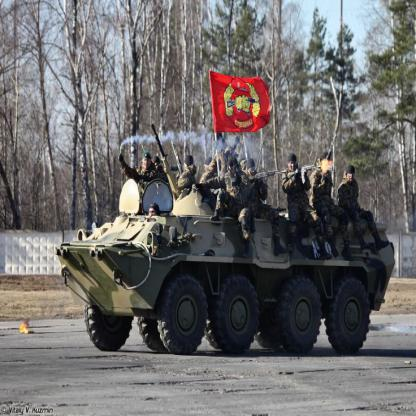

In [ ]:
import glob
from IPython.display import Image, display

Image(filename = "/content/yolov5/train/images/10_jpg.rf.ebaf4ec56e87211ac2aaf61a1f41cfd6.jpg")

#Install Dependencies

Remember to choose GPU in Runtime 

In [ ]:
# install dependencies as necessary
# On a local machine, will likely need pytorch, pyyaml (not yaml), tqdm and more
import os
!pip install -qr requirements.txt  # install dependencies (ignore errors)
# !pip install -r requirements.txt wandb # install (add W&B for logging)
import torch

from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))


     |████████████████████████████████| 596 kB 4.3 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


### Set up the data YAML config file

In [ ]:
# this is the preloaded YAML file wrote during the annotation process
%cd /content/yolov5
%cat data.yaml

/content/yolov5
train: ../train/images
val: ../valid/images

nc: 10
names: ['bm-21', 'bmd-2', 'bmp-1', 'bmp-2', 'btr-70', 'btr-80', 'mt-lb', 't-64', 't-72', 't-80']

In [ ]:
# change folder address in yaml file
# With help from Akeem Wells (https://www.akeemjwells.com/)
f1 = open("data.yaml", 'r')
f2 = open("new_data.yaml", 'w')
for line in f1.readlines():
  if "../" in line:
    line = line.replace("../", "/content/yolov5/")
  f2.write(line)

f2.close()
f1.close()

os.rename("data.yaml", "old_data.yaml")
os.rename("new_data.yaml", "data.yaml")

%cat data.yaml

train: /content/yolov5/train/images
val: /content/yolov5/valid/images

nc: 10
names: ['bm-21', 'bmd-2', 'bmp-1', 'bmp-2', 'btr-70', 'btr-80', 'mt-lb', 't-64', 't-72', 't-80']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

num_classes

'10'

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

### Side Note on Hyperparameter Evolution

In ML tasks, hyperparameters control various aspects of training, and finding optimal values for them can be a challenge. "Traditional methods like grid searches can quickly become intractable due to 1) the high dimensional search space 2) unknown correlations among the dimensions, and 3) expensive nature of evaluating the fitness at each point, making Genetic Algorithms (GA) a suitable candidate for hyperparameter searches." ([G. Jocher, YOLOv5 Documentation](https://docs.ultralytics.com/tutorials/hyperparameter-evolution/))



Hyperparameter evolution is a method of Hyperparameter Optimization using a Genetic Algorithm (GA) for optimization (the plot below shows evolutions results from YOLOv5 documentation). If we chose to implement this, the documentation recommends a minimum of 300 generations of evolution for best results. Given that YOLOv5 has about 30 hyperparameters, evolution would be exceedinly expensive and time consuming, as the base scenario is trained hundreds of times, possibly requiring hundreds or thousands of GPU hours. As a result, the documentation states that well-informed initial guesses will likely produce better final results.

![](https://user-images.githubusercontent.com/26833433/89130469-f43e8e00-d4b9-11ea-9e28-f8ae3622516d.png)





In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

### Hyperparameter Selection



In [ ]:
%%writetemplate /content/yolov5/data/hyps/hyp.custom.yaml

# high augmentation
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.1  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.3  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 0.7  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.9  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.1  # image mixup (probability)
copy_paste: 0.1  # segment copy-paste (probability)

# Model 1 - YOLOvs (small model)

**Model Archecture**

In [ ]:
%%writetemplate /content/yolov5/models/custom-yolov5s.yaml

# Parameters
nc: num_classes  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Model 2 YOLOv5l (large model)
- same hyperparameters

In [ ]:
%%writetemplate /content/yolov5/models/custom-yolov5l.yaml

# Parameters
nc: num_classes  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

Here, we are able to pass a number of arguments:
- **img:** define input image size (best with multiples of 32. Better results with 1280, for instance)
- **batch:** determine batch size (min 32, bigger is better)
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

### Train small YOLOv5

In [ ]:
# time its performance 
%%time
!python train.py --img 640 --batch 16 --epochs 100 --data data.yaml\
  --weights yolov5s.pt\
  --hyp hyp.custom.yaml\
  --cfg custom-yolov5s.yaml\
  --name v5s_results

# --cache    --project 'runs_vehicles' --img 832 --optimizer Adam

train: weights=yolov5s.pt, cfg=custom-yolov5s.yaml, data=data.yaml, hyp=hyp.custom.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 10 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-395-g29657d1 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.

### Train large YOLOv5

In [ ]:
%%time
!python train.py --img 640 --batch 16 --epochs 100 --data data.yaml\
  --weights yolov5l.pt\
  --hyp hyp.custom.yaml\
  --cfg custom-yolov5l.yaml\
  --name v5l_results

train: weights=yolov5l.pt, cfg=custom-yolov5l.yaml, data=data.yaml, hyp=hyp.custom.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v5l_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 10 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-395-g29657d1 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.

# Evaluate Custom YOLOv5 Detector Performance

**mAP**

The computer vision community has converged on the Mean Average Precision ("mAP") metric to compare the performance of object detection systems. Object detection models make predictions in terms of a bounding box and a class label. First, The Intersection over Union (IoU) measures as the amount of predicted bounding box that overlaps with the ground truth bounding box divided by the total area of both bounding boxes. Next, it calculates the average precision (AP) for each class individually across all of the IoU thresholds. The mAP Then the metric averages the mAP for all classes to arrive at the final estimate. ([J. Solawetz, 2020](https://blog.roboflow.com/mean-average-precision/))

**Box Loss, Objectness Loss and Classification Loss**

mAP will generally show the inverse shape of the loss. There are three different types of loss shown here: box loss, objectness loss and classification loss. ([M. Kasper-Eulaers, 2021](https://www.researchgate.net/publication/350540629_Short_Communication_Detecting_Heavy_Goods_Vehicles_in_Rest_Areas_in_Winter_Conditions_Using_YOLOv5))
- The box loss represents how well the algorithm can locate the centre of an object and how well the predicted bounding box covers an object. 

- Objectness is essentially a measure of the probability that an object exists in a proposed region of interest. If the objectivity is high, this means that the image window is likely to contain an object. 

- Classification loss gives an idea of how well the algorithm can predict the correct class of a given object.

**Assessment of our model**

The model improved swiftly in terms of precision, recall and mean average precision before plateauing after about 150 epochs. The box, objectness and classification losses of the validation data also showed a rapid decline until around epoch 150. YOLOv5 automatically saves the best weights/model.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
s_metrics = pd.read_csv('/content/yolov5/runs/train/v5s_results/results.csv')\
  .add_suffix("_s")\
  .rename(columns={'               epoch_s':'epoch'})
l_metrics = pd.read_csv('/content/yolov5/runs/train/v5l_results/results.csv')\
  .add_suffix("_l")\
  .rename(columns={'               epoch_l':'epoch'})

In [ ]:
cols_pivot_s = list(s_metrics.columns)[1:]
cols_pivot_l = list(l_metrics.columns)[1:]

s_metrics_long = s_metrics.melt(id_vars='epoch', value_vars = cols_pivot_s,
                  var_name = 'model', value_name = 'metric')

l_metrics_long = l_metrics.melt(id_vars='epoch', value_vars = cols_pivot_l,
                  var_name = 'model', value_name = 'metric')

metrics_long = s_metrics_long.append(l_metrics_long).reset_index()
metrics_long['model'] = metrics_long['model'].str.lstrip()
metrics_long['metric'] = metrics_long['metric'].round(3)

train_box = metrics_long.query("model.str.contains('train/box')", engine='python')
train_obj = metrics_long.query("model.str.contains('train/obj')", engine='python')
train_cls = metrics_long.query("model.str.contains('train/cls')", engine='python')
val_box = metrics_long.query("model.str.contains('val/box')", engine='python')
val_obj = metrics_long.query("model.str.contains('val/obj')", engine='python')
val_cls = metrics_long.query("model.str.contains('val/cls')", engine='python')
prec = metrics_long.query("model.str.contains('precision')", engine='python')
rec = metrics_long.query("model.str.contains('recall')", engine='python')
mAP = metrics_long.query("model.str.contains('mAP_0.5_')", engine='python')

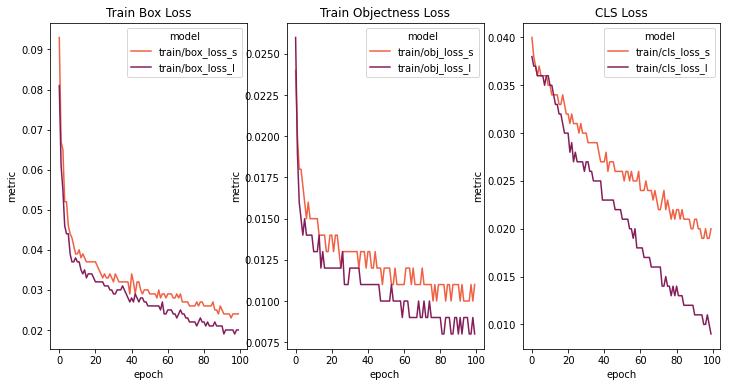

In [ ]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 12,6
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharey=False)

palette = sns.color_palette("rocket_r", 2)
sns.lineplot(data=train_box, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax1)\
    .set(title='Train Box Loss');

sns.lineplot(data=train_obj, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax2)\
    .set(title='Train Objectness Loss');

sns.lineplot(data=train_cls, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax3)\
    .set(title='CLS Loss');

from google.colab import files
plt.savefig("/content/yolov5/runs/loss_metrics.png")
#files.download("abc.png") 

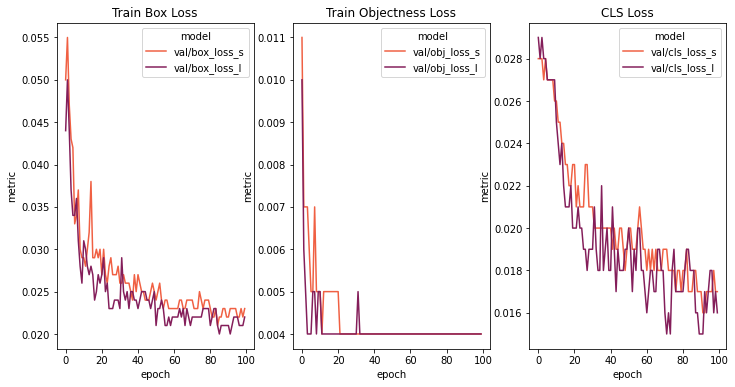

In [ ]:
rcParams['figure.figsize'] = 12,6
fig, (ax4, ax5, ax6) = plt.subplots(ncols=3, sharey=False)
sns.lineplot(data=val_box, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax4)\
    .set(title='Train Box Loss')

sns.lineplot(data=val_obj, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax5)\
    .set(title='Train Objectness Loss')

sns.lineplot(data=val_cls, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax6)\
    .set(title='CLS Loss');

plt.savefig("/content/yolov5/runs/loss_metrics2.png")

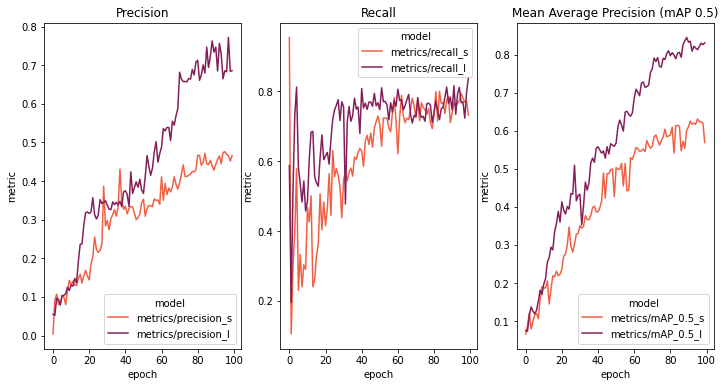

In [ ]:
rcParams['figure.figsize'] = 12,6
fig, (ax7, ax8, ax9) = plt.subplots(ncols=3, sharey=False)
sns.lineplot(data=prec, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax7)\
    .set(title='Precision')

sns.lineplot(data=rec, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax8)\
    .set(title='Recall')

sns.lineplot(data=mAP, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax9)\
    .set(title='Mean Average Precision (mAP 0.5)');

plt.savefig("/content/yolov5/runs/accuracy_metrics.png")

In [ ]:
%cd

/root


### Visualize Our Training Data with Labels

GROUND TRUTH TRAINING DATA:


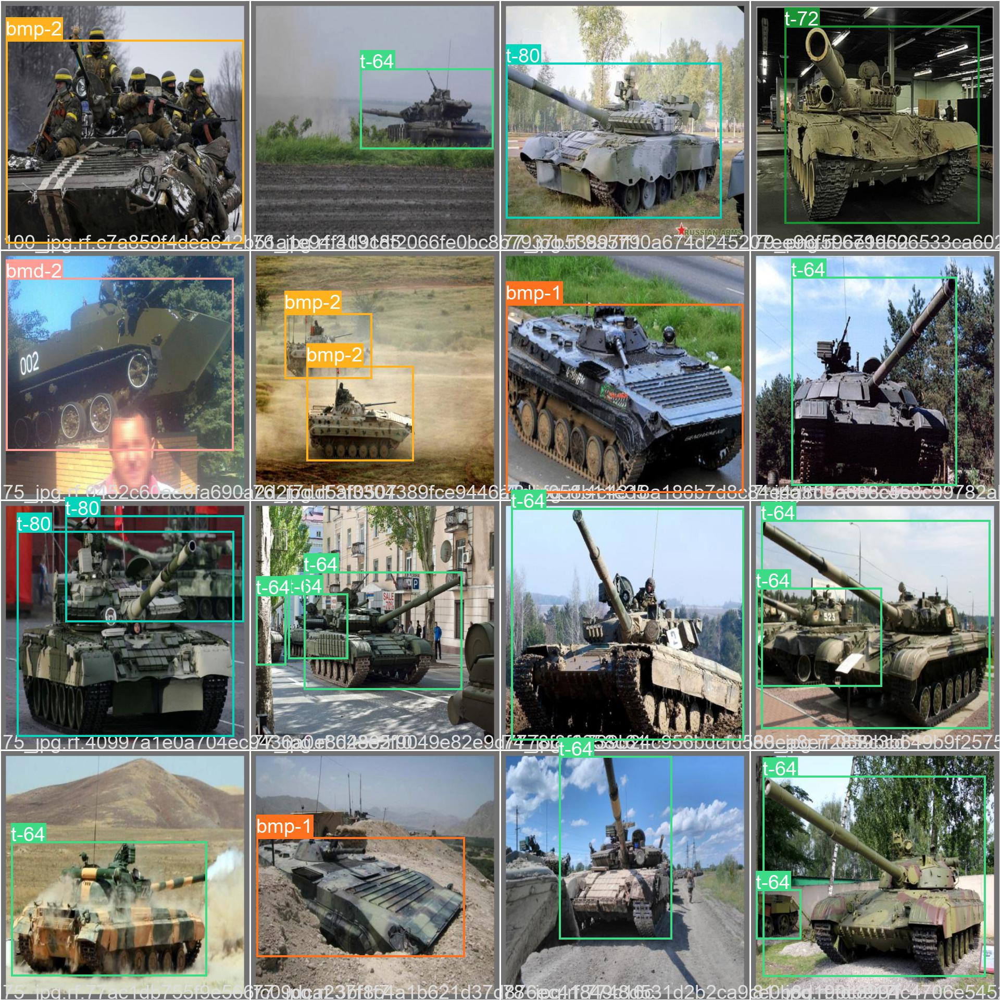

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/v5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


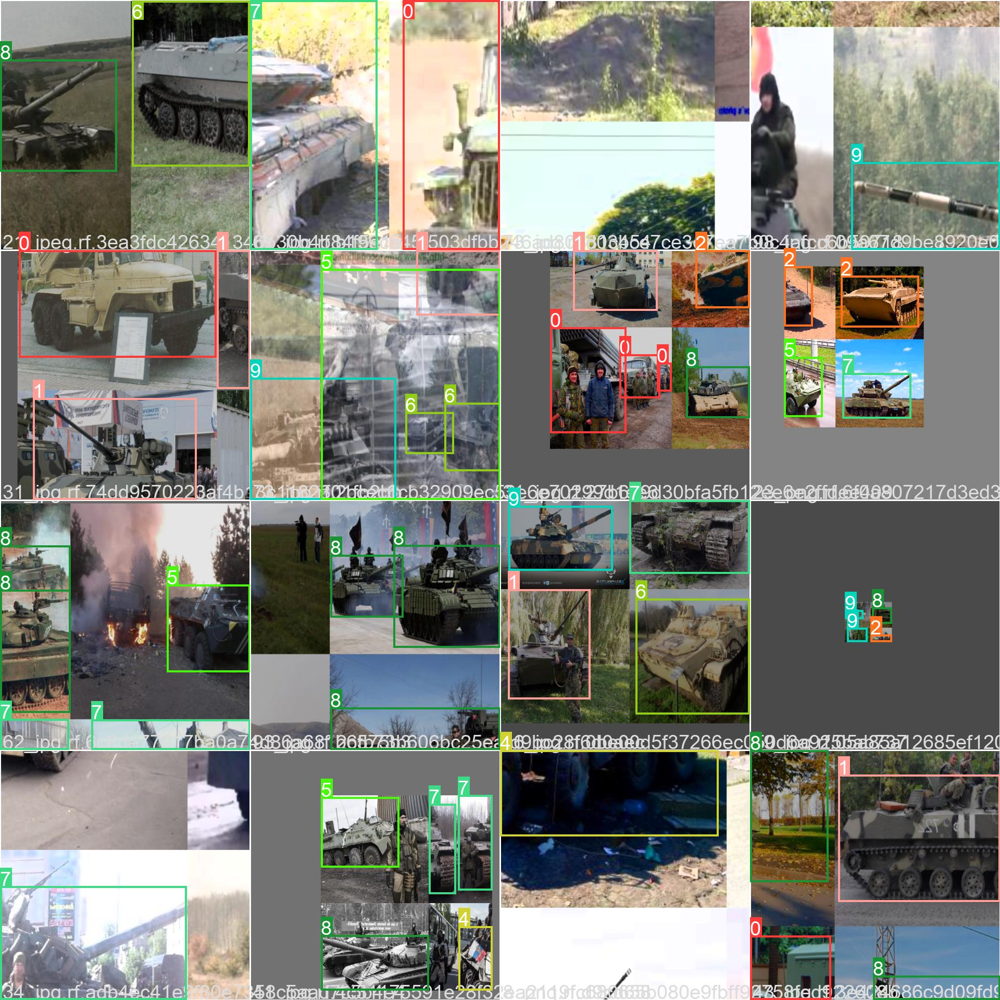

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/v5l_results/train_batch0.jpg', width=900)

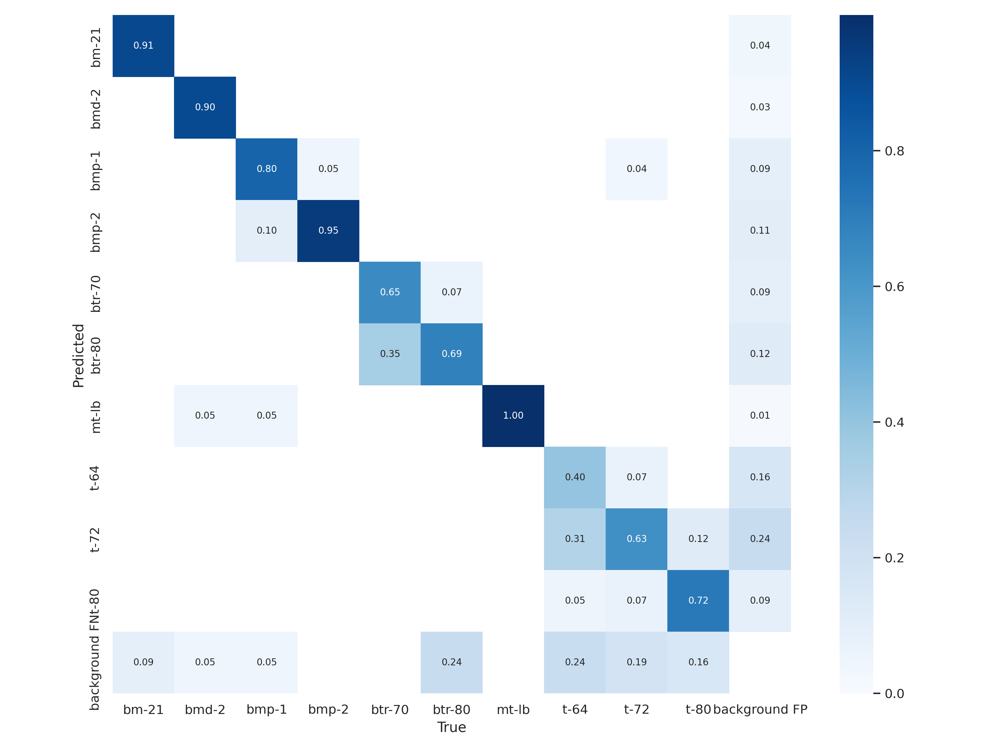

In [ ]:
Image(filename="/content/yolov5/runs/train/v5l_results/confusion_matrix.png", width = 1200, height = 800)

# Validate by testing on unseen data

- With TTA and ensembled

In [ ]:
# create validation yaml
%%writetemplate /content/yolov5/data-val.yaml

train: /content/yolov5/train/images
val: /content/yolov5/test/images

nc: 10
names: ['bm-21', 'bmd-2', 'bmp-1', 'bmp-2', 'btr-70',
        'btr-80', 'mt-lb', 't-64', 't-72', 't-80']

In [ ]:
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt\
  --data /content/yolov5/data-val.yaml\
  --img 832\
  --augment

#   --conf 0.001 --iou 0.65\
# --half', action='store_true', help='use FP16 half-precision inference')

val: data=/content/yolov5/data-val.yaml, weights=['/content/yolov5/runs/train/v5l_results/weights/best.pt'], batch_size=32, imgsz=832, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=../content/yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-395-g29657d1 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom-YOLOv5l summary: 367 layers, 46156743 parameters, 0 gradients, 107.8 GFLOPs
val: Scanning '/content/yolov5/test/labels.cache' images and labels... 100 found, 0 missing, 0 empty, 0 corrupt: 100% 100/100 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:07<00:00,  1.86s/it]
                 all        100        120      0.741      0.847      0.843      0.701
               bm-21        100         13      

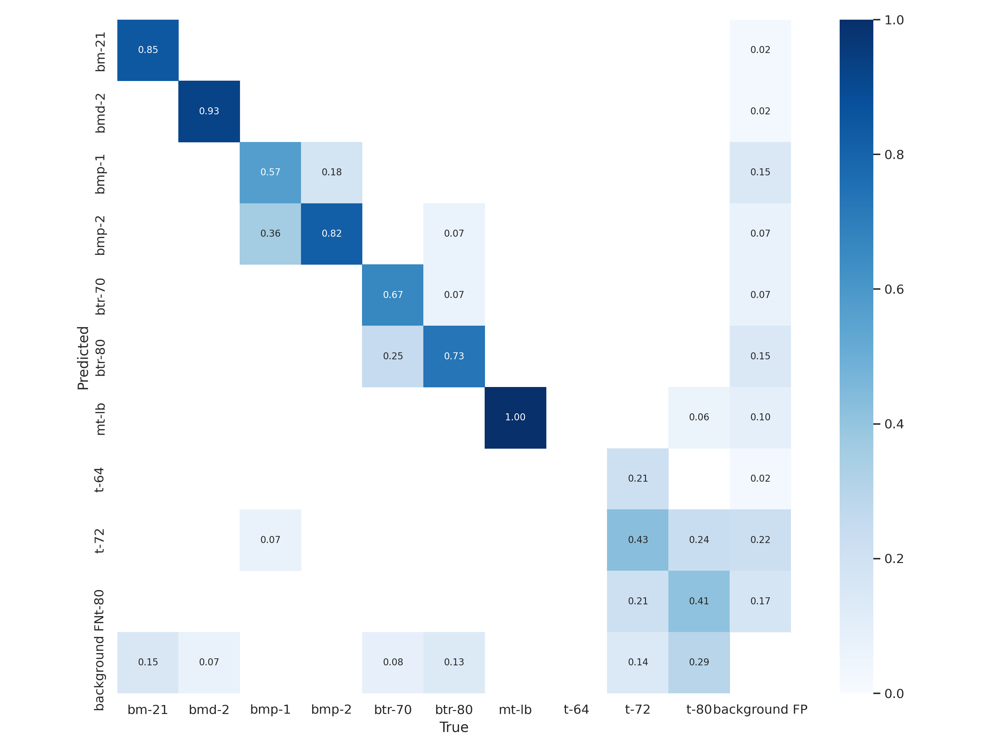

In [ ]:
Image(filename="/content/yolov5/runs/val/exp3/confusion_matrix.png", width = 1200, height = 800)

In [ ]:
# notice the inference time. 
# detect.py use the best weights to test on test images/video
# increase img size 30% with --augment
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt /content/yolov5/runs/train/v5s_results/weights/best.pt\
  --img 820\
  --conf 0.3\
  --source /content/yolov5/test/images\
  --augment\
  --visualize

/content/yolov5
detect: weights=['/content/yolov5/runs/train/v5l_results/weights/best.pt', '/content/yolov5/runs/train/v5s_results/weights/best.pt'], source=/content/yolov5/test/images, data=data/coco128.yaml, imgsz=[820, 820], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=True, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-395-g29657d1 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom-YOLOv5l summary: 367 layers, 46156743 parameters, 0 gradients, 107.8 GFLOPs
Fusing layers... 
custom-YOLOv5s summary: 213 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
Ensemble created with ['/content/yolov5/runs/train/v5l_results/weights/best.pt', '/content/yolov5/runs/train/v5s_results/weights/best.p

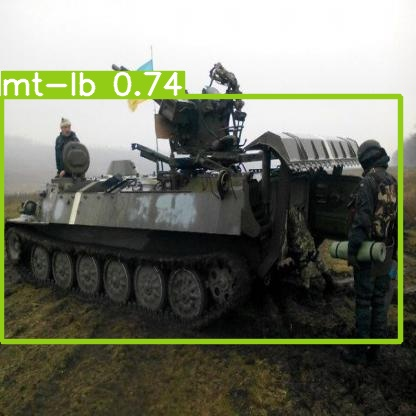

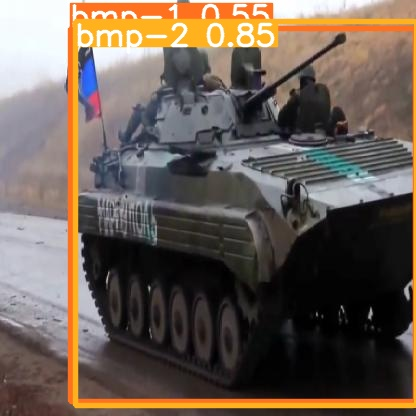

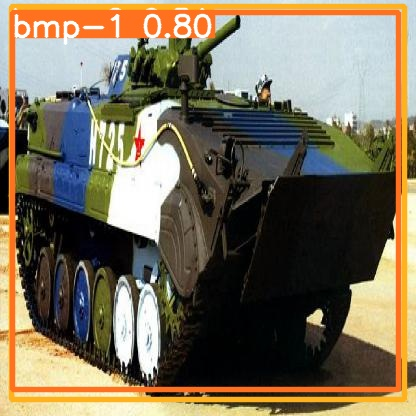

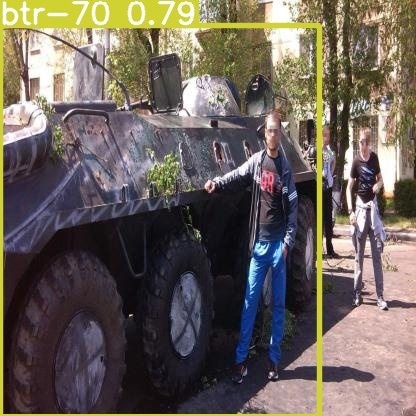

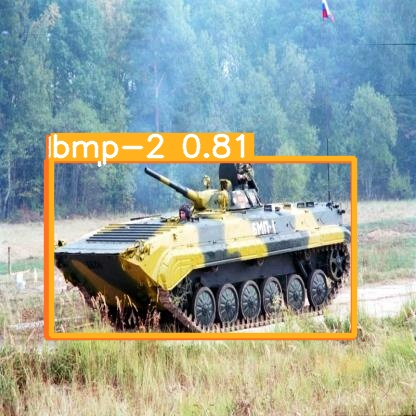

...

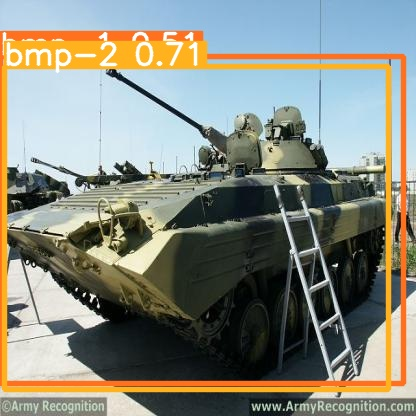

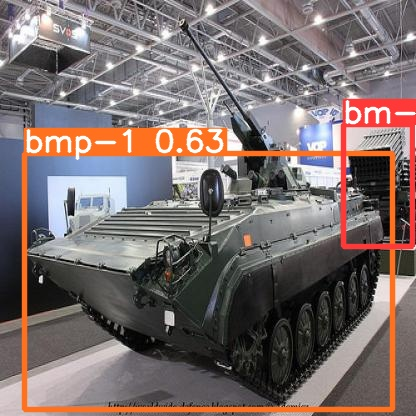

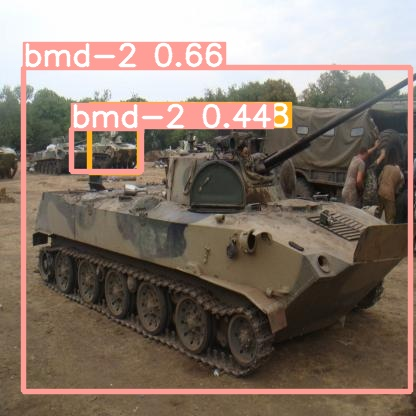

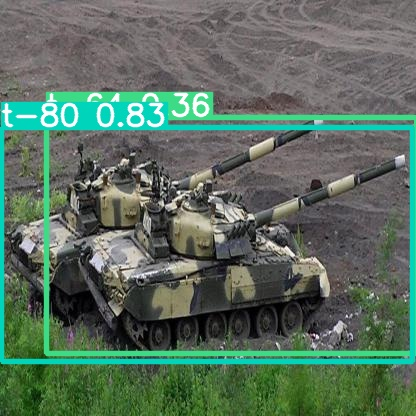

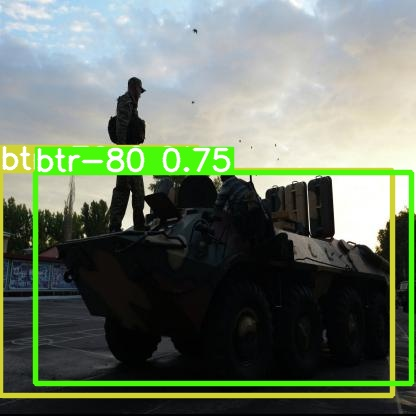

In [ ]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Detect on video by URL

In [ ]:
# !pip install pafy
# !pip install youtube_dl
# !pip uninstall -y pafy
# !pip install youtube-dl==2020.12.2

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt /content/yolov5/runs/train/v5s_results/weights/best.pt\
  --img 416 --conf 0.3\
  --source https://youtu.be/-7nKPpb8rEk\
  --augment

# long no much https://www.youtube.com/watch?v=MyBoXnDvGH0
# too fast and blurry https://www.youtube.com/watch?v=sIkFssD71Bk
# Russian convoy - no logos https://videos.dailymail.co.uk/video/mol/2022/02/22/1537992909869071522/640x360_MP4_1537992909869071522.mp4
# https://www.youtube.com/watch?v=KuWafnYsK1g
# https://www.youtube.com/watch?v=sIkFssD71Bk
# https://www.instagram.com/accounts/login/?next=/p/Bu-qLUDgoll/
# https://instagram.com/p/Bu_m1vlgLyK/?utm_source=ig_share_sheet&igshid=15dr5hyq9moyq

# Export result

Save to google drive:  
- results from all experiments (evaluation data and images)
- final/best model for future inference


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# copy train results
%cp -r /content/yolov5/runs/train/v5l_results/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5l_results/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5l_results/*.csv /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5s_results/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5s_results/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5s_results/*.csv /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results

# copy train metrics
%cp -r /content/yolov5/runs/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results

# copy val.py results on unseen data
%cp -r /content/yolov5/runs/val/exp/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/detect-results
%cp -r /content/yolov5/runs/val/exp2/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/detect-results

# copy final hold out images
%cp -r /content/yolov5/runs/detect/exp/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/hold-out-predictions

# video
#%cp -r /content/yolov5/runs/detect/exp9/-7nKPpb8rEk.mp4 /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs

# save best.pt for future inference
%cp -r /content/yolov5/runs/train/v5l_results/weights/best.pt /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/best-model-v5l
%cp -r /content/yolov5/runs/train/v5s_results/weights/best.pt /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/best-model-v5s

cp: cannot stat '/content/yolov5/runs/val/exp/*.jpg': No such file or directory


In [ ]:
# copy feature maps

%cp -r /content/yolov5/runs/detect/exp3/100_png.rf.a5a49d0908d14aa33ec781cea2690730/*png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs

In [ ]:
!pip list

Package                       Version
----------------------------- ------------------------------
absl-py                       1.1.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.2.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arviz                         0.12.1
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
atari-py                      0.2.9
atomicwrites                  1.4.0
attrs                         21.4.0
audioread                     2.1.9
autograd                      1.4
Babel                         2.10.2
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.0
blis                          0.7.7
bokeh                         2.3.3
branca                        0.5.0
bs4                           0.0.1
CacheControl                  0.